In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import e3nn
from e3nn import o3, io
import numpy as np
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import open3d as o3d
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm.notebook import tqdm
from functools import partial, reduce


device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/cuda/__init__.py:118: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


'cpu'

In [2]:
from data_generation import SimpleShapeDataset, SimpleShapeUniformRayDataset

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

data = next(iter(DataLoader(dataset, batch_size=1))).float()

In [3]:
# how does it look like in spherical harmonics?

sphten = io.SphericalTensor(11, 1, 1)
signal = o3.spherical_harmonics(sphten, x=data, normalize=False).mean(dim=[0, 1])

fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
# fig.add_trace(go.Scatter3d(x=0.12 * data[0, :, 0], y=0.12 * data[0, :, 1], z=0.12 * data[0, :, 2]), row=1, col=2)
fig.add_trace(go.Surface(sphten.plotly_surface(signal, radius=True)[0]), row=1, col=2)
fig.add_trace(go.Scatter3d(x=data[0, :, 0], y=data[0, :, 1], z=data[0, :, 2]), row=1, col=1)

In [89]:
# # o3.FullyConnectedTensorProduct(irreps_in1=o3.Irreps('30e'), irreps_in2=o3.Irreps('30e'), irreps_out=o3.Irreps('30e'))
# sphten = io.SphericalTensor(lmax=14, p_val=1, p_arg=1)
# 
# o3.spherical_harmonics(l=sphten, x=sphten.randn(-1), normalize=False)

NotImplementedError: spherical_harmonics maximum l implemented is 11, send us an email to ask for more

In [95]:
class SelfTP(nn.Module):
    def __init__(self, irreps_in, irreps_out, batch_norm=True):
        super(SelfTP, self).__init__()
        
        self.tp = o3.FullyConnectedTensorProduct(irreps_in1=irreps_in, irreps_in2=irreps_in, irreps_out=irreps_out)
        self.bn = e3nn.nn.BatchNorm(irreps_out)
        self.batch_norm = batch_norm
        
    def forward(self, x):
        x = self.tp(x, x)
        if self.batch_norm:
            x = self.bn(x)
        return x      


class EncoderDecoder(nn.Module):
    def __init__(self):
        super(EncoderDecoder, self).__init__()
        
        self.irrep_layer = []
        tw = 1
        lmax = 5
        for l in range(lmax, 0, -1): # last one sould be lmax=1
            irreps = io.SphericalTensor(lmax=l, p_arg=1, p_val=1)
            irreps = irreps * tw
            irreps = (irreps.sort())[0]
            irreps = irreps.simplify()
            self.irrep_layer.append(irreps)
            tw *= 2
        
        # todo should the last layer have batch norm?
        # todo use fully connected tensor product?
        self.encoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i], irreps_out=self.irrep_layer[i+1], batch_norm=(i != len(self.irrep_layer)-2))
            for i in range(len(self.irrep_layer)-1)
        ])

        # todo is the information bottleneck limited enough?
        self.decoder = nn.Sequential(*[
            SelfTP(irreps_in=self.irrep_layer[i+1], irreps_out=self.irrep_layer[i], batch_norm=(i != 0))
            for i in range(len(self.irrep_layer)-2, -1, -1)            
        ])

    def forward(self, points):
        inp = o3.spherical_harmonics(l=self.irrep_layer[0], x=points, normalize=False).mean(dim=1) # todo fix the normalization later
        latent = self.encoder(inp)
        out = self.decoder(latent)
        return inp, latent, out

print("number of parameters = ", sum([np.prod(x.shape) for x in EncoderDecoder().parameters()]))

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

number of parameters =  31927


/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.



/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

  0%|          | 0/200 [00:00<?, ?it/s]

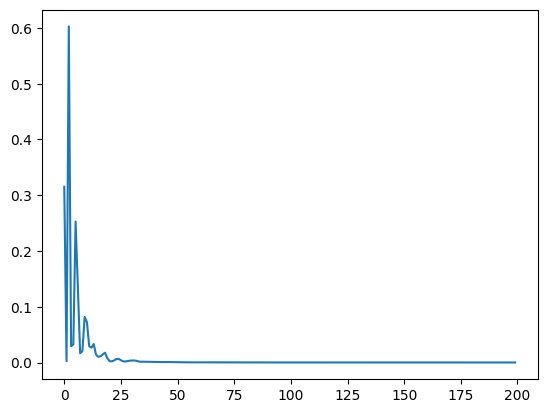

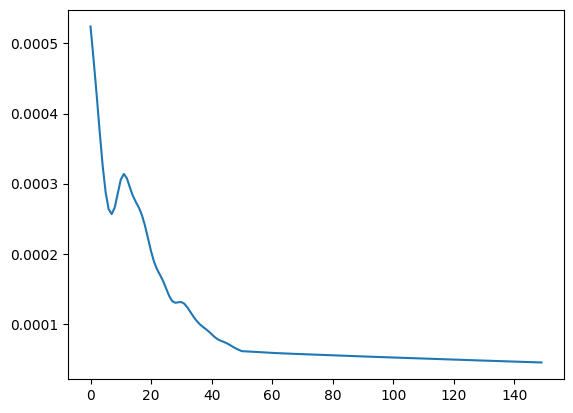

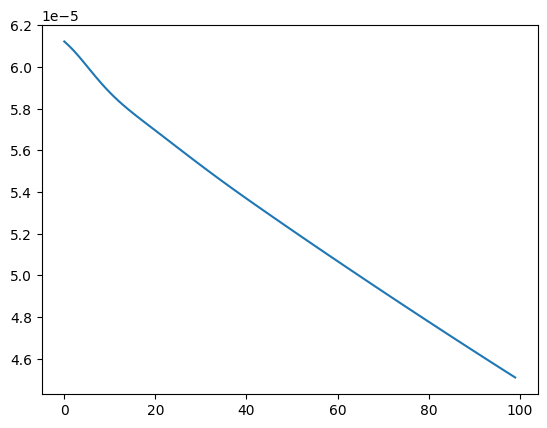

In [106]:
epochs = 200

dataset = SimpleShapeUniformRayDataset(sample_points=20000)
model = EncoderDecoder().to(device) # lmax=7
optimizer = torch.optim.Adam(model.parameters(), lr=1)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100], gamma=0.1) # todo interesting apparently you shouldn't change rl
loss_fn = torch.nn.HuberLoss(reduction='mean')

dataloader = DataLoader(dataset, batch_size=len(dataset))
# single_data = next(iter(dataloader)).float().to(device)

pbar = tqdm(range(epochs))
losses = []
for i in pbar:
    for data in dataloader:
        data = data.float().to(device)
        inp, latent, out = model(data)
        loss = loss_fn(inp, out)
        optimizer.zero_grad()
        loss.backward()
        max_grad = max([torch.linalg.norm(p.grad).item() for p in model.parameters() if p.grad is not None])
        optimizer.step()
        pbar.set_description(f'Epoch {i+1} Loss: {loss.item():.8f} Lr={scheduler.get_last_lr()[0]} MaxGrad={max_grad:.4f}')
        losses.append(loss.item())
    scheduler.step()

plt.plot(losses)
plt.figure()
plt.plot(losses[50:])
plt.figure()
plt.plot(losses[100:])

In [109]:
single_data = next(iter(dataloader)).float().to(device)

inp, latent, out = model(single_data)
inp = inp.cpu().detach()
latent = latent.cpu().detach()
out = out.cpu().detach()

print('loss', loss_fn(inp, out))
print('L-inf loss', torch.max(torch.abs(inp - out)))

lmax = 5 # fixed for this spherical tensor
sphten = io.SphericalTensor(lmax, 1, 1)
fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
fig.add_trace(go.Surface(sphten.plotly_surface(out, radius=True)[0]), row=1, col=1)
fig.add_trace(go.Surface(sphten.plotly_surface(inp, radius=True)[0]), row=1, col=2)

loss tensor(4.4960e-05)
L-inf loss tensor(0.0198)
